<p><center><h1><b>Impact of Missing Data and Different Imputation Methods on Image Processing</b></h1></center></p>

<br><p><h4> <b>Introduction</b> </h4></p>

In this project, we will explore the effects of missing data and various ways to impute it using Python. We will use two distinct paintings: "Starry Night on the Rhone" by Vincent Van Gogh and an unnamed abstract piece resembling Jackson Pollock's style. By analyzing the effectiveness of different imputation techniques, this hands-on approach will provide insights into handling missing data in a spatial context.

<br><p><h4> <b>Paintings Selection and Loading</b> </h4></p>

Select two paintings of your interest. These must be medium size (around 300 x 400 pixels) and PNG format. The chosen paintings should be visually distinct; one with clear structures and the other abstract. 

Load them in Python using `matplotlib.image` and its `imread` function. Convert the images to grayscale by averaging the RGB values. Use `plt.matshow(fignum=0)` to display the images efficiently.

<br>

For this project, I will use the following paintings: 

- **Painting 1**: *Starry Night on the Rhone by Vincent Van Gogh*

<center><img src="starry_night_on_the_rhone.png" alt="Starry Night on the Rhode" width="500"/></center>


<br> 

- **Painting 2**: *Untitled by Jackson Pollock*

<center><img src="jakson_pollock.png" alt="Untitled by Jackson Pollock" width="500"/></center>

These images will be used to analyze the impact of missing data and different imputation techniques.

In [1]:
# Import required libraries
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from scipy.interpolate import griddata

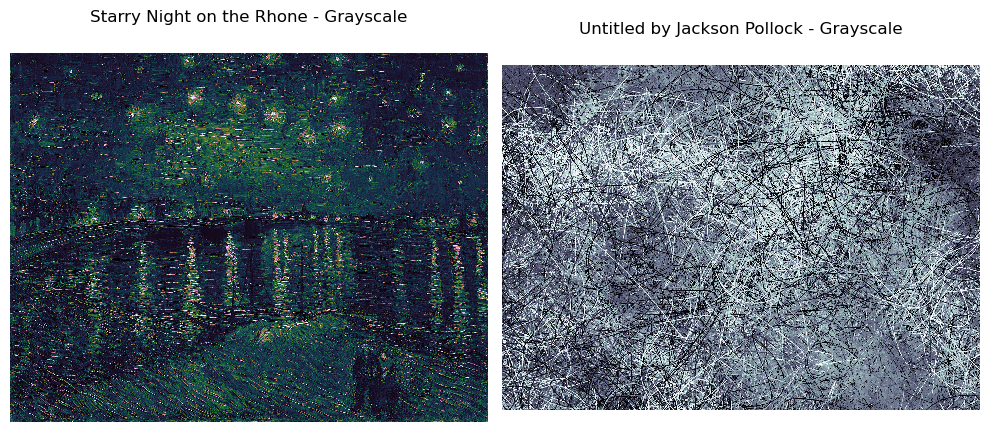

In [2]:
# Load the images
image1 = mpimg.imread('starry_night_on_the_rhone.png')
image2 = mpimg.imread('jakson_pollock.png')

# Convert images to grayscale by averaging the RGB values
def rgb2gray(rgb):
    return np.dot(rgb, [0.2989, 0.5870, 0.1140])

gray_starry = rgb2gray(image1)
gray_pollock = rgb2gray(image2)

# Display the images using plt.matshow()
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title("Starry Night on the Rhone - Grayscale")
plt.matshow(gray_starry, fignum=0, cmap='cubehelix', vmin=0, vmax=1)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Untitled by Jackson Pollock - Grayscale")
plt.matshow(gray_pollock, fignum=0, cmap='bone', vmin=0, vmax=1)
plt.axis('off')

plt.tight_layout()
plt.show()

<br><p><h4> <b>Simulate Missing Data</b> </h4></p>

Now we are going to simulate losing 50% of the data. To do this, create a random selection matrix that only preserves the positions of the pixels that will survive. I recommend using numpy.random.randint(). Those that die, replace them with np.NaN.

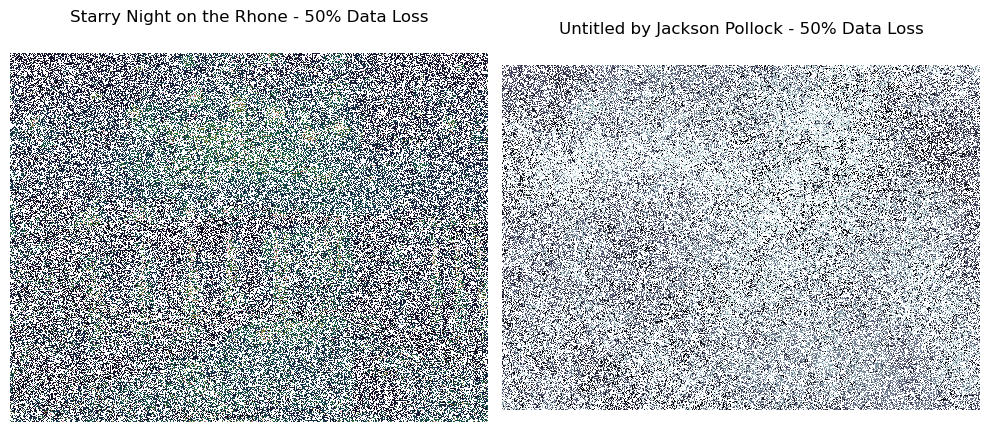

In [3]:
# Function to simulate losing 50% of the data
def lose_data(image, loss_fraction=0.5):
    # Keep only 50% of the pixels
    mask = np.random.rand(*image.shape) > loss_fraction
    # Create the output image with NaNs where data is lost
    corrupted_image = np.where(mask, image, np.nan)
    return corrupted_image

# Simulate losing 50% of the data
corrupted_starry = lose_data(gray_starry)
corrupted_pollock = lose_data(gray_pollock)

# Display the images with lost data
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title("Starry Night on the Rhone - 50% Data Loss")
plt.matshow(corrupted_starry, fignum=0, cmap='cubehelix', vmin=0, vmax=1)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Untitled by Jackson Pollock - 50% Data Loss")
plt.matshow(corrupted_pollock, fignum=0, cmap='bone', vmin=0, vmax=1)
plt.axis('off')

plt.tight_layout()
plt.show()

<br><p><h4> <b>Random Imputation </b> </h4></p>

Replace all missing values ​​with zeros and graph.

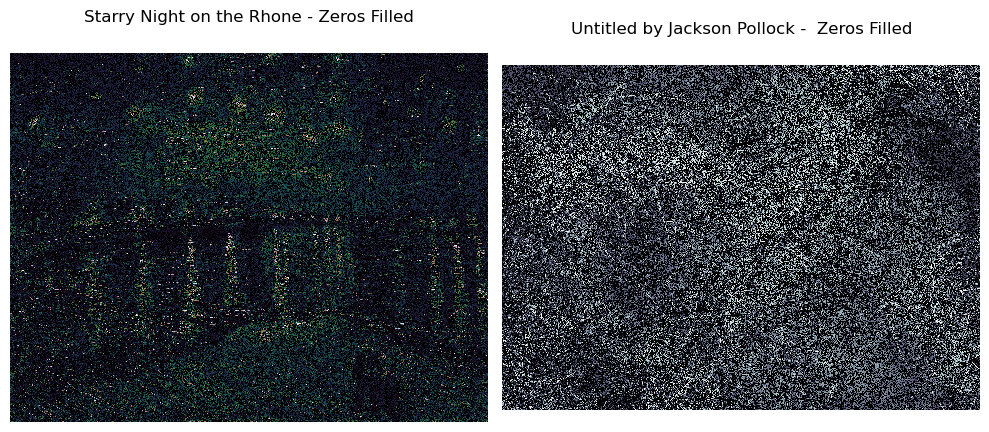

In [4]:
# Replace NaNs with zeros
corrupted_starry_zero_filled = np.nan_to_num(corrupted_starry, nan=0.0)
corrupted_pollock_zero_filled = np.nan_to_num(corrupted_pollock, nan=0.0)

# Display the images with lost data
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title("Starry Night on the Rhone - Zeros Filled")
plt.matshow(corrupted_starry_zero_filled, fignum=0, cmap='cubehelix', vmin=0, vmax=1)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Untitled by Jackson Pollock -  Zeros Filled")
plt.matshow(corrupted_pollock_zero_filled, fignum=0, cmap='bone', vmin=0, vmax=1)
plt.axis('off')

plt.tight_layout()
plt.show()

<br><p><h4> <b>Mean and Median Imputation</b> </h4></p>

Change the missing values ​​to the mean and median of the data you didn't miss.

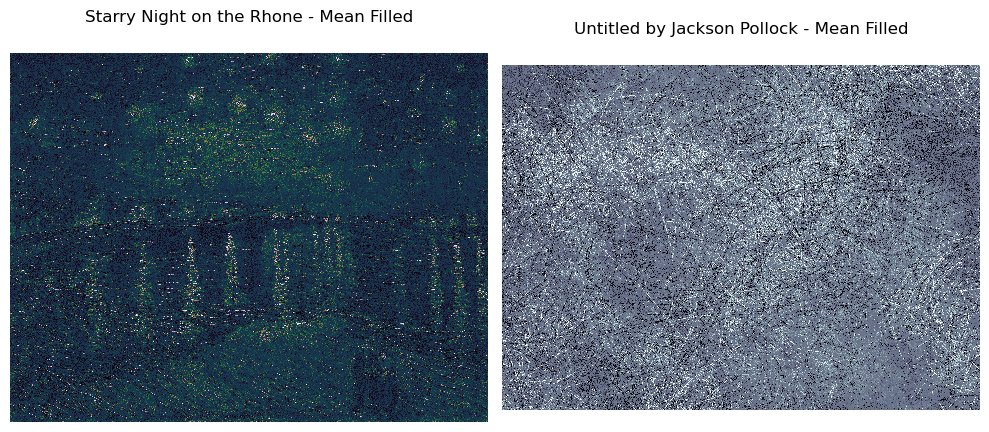

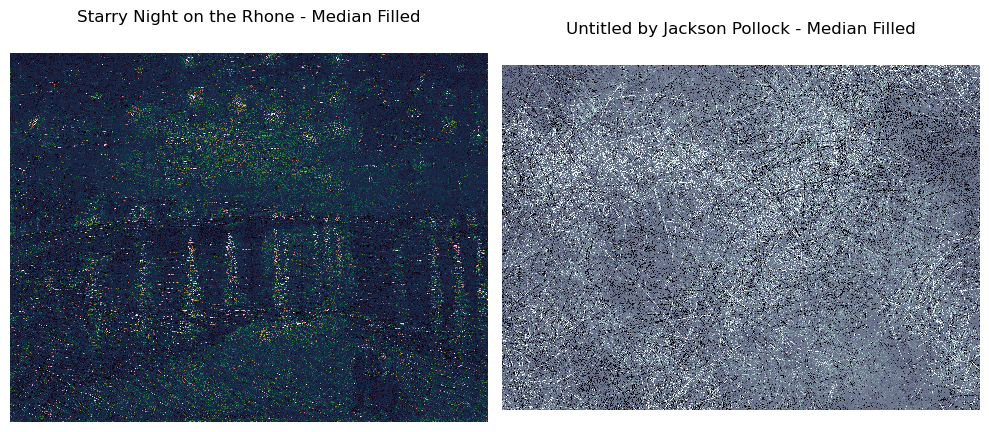

In [5]:
# Function to replace NaNs with the mean of the non-missing data
def replace_nan_with_mean(image):
    mean_value = np.nanmean(image)
    filled_image = np.where(np.isnan(image), mean_value, image)
    return filled_image

# Function to replace NaNs with the median of the non-missing data
def replace_nan_with_median(image):
    median_value = np.nanmedian(image)
    filled_image = np.where(np.isnan(image), median_value, image)
    return filled_image

# Replace NaNs with mean
corrupted_images_mean_filled = [replace_nan_with_mean(image) for image in (corrupted_starry, corrupted_pollock)]

# Replace NaNs with median
corrupted_images_median_filled = [replace_nan_with_median(image) for image in (corrupted_starry, corrupted_pollock)]

# Function to display 2 images with interpolated NaNs
def plot_mean_median_interpolations(corrupted_images, interpolation_type):
    plt.figure(figsize=(10, 5))
    for i in range(2):
        plt.subplot(1, 2, i+1)
        plt.title(f"{["Starry Night on the Rhone", "Untitled by Jackson Pollock"][i]} - {interpolation_type} Filled")
        plt.matshow(corrupted_images[i], fignum=0, cmap='cubehelix' if i == 0 else 'bone', vmin=0, vmax=1)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Display the images with NaNs replaced by mean and median
plot_mean_median_interpolations(corrupted_images_mean_filled, 'Mean')
plot_mean_median_interpolations(corrupted_images_median_filled, 'Median')

<br><p><h4> <b>Spatial Interpolation</b> </h4></p>

This data has a spatial structure. Use interpolation: nearest neighbor, linear, and cubic. Scipy.interpolate has a function called griddata. What differences do you see, especially at the edges of the image?

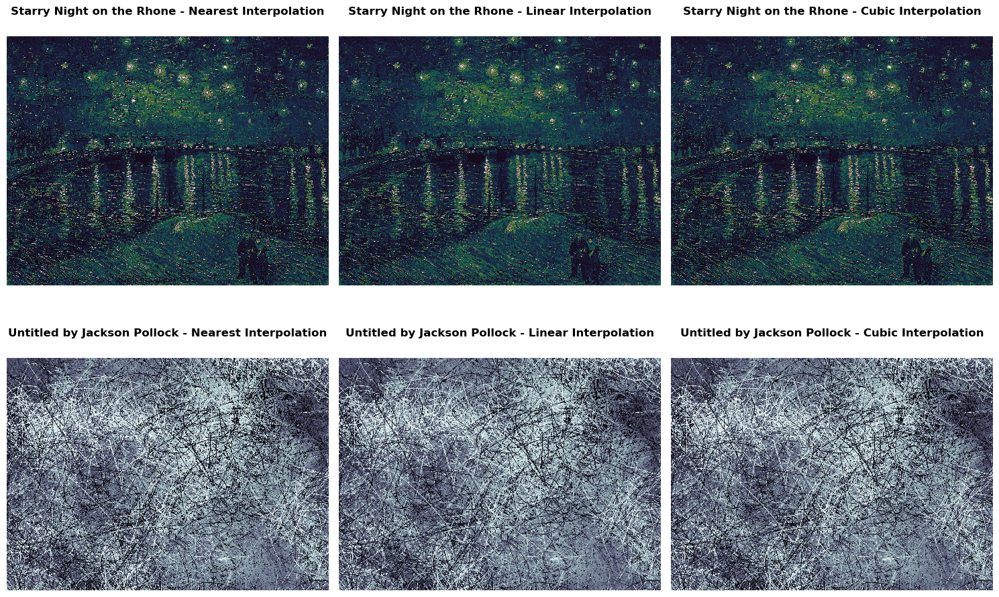

In [6]:
# Function to prepare data and Interpolate the image using different methods
def interpolate_image(corrupted_image, method):
    # Prepare the coordinates for interpolation
    x, y = np.meshgrid(np.arange(corrupted_image.shape[1]), np.arange(corrupted_image.shape[0]))
    points = np.array((x[~np.isnan(corrupted_image)], y[~np.isnan(corrupted_image)])).T
    values = corrupted_image[~np.isnan(corrupted_image)]
    
    # Interpolate the image using a specific method
    interpolated_image_z = griddata(points, values, (x, y), method=method)
    return interpolated_image_z

# Define methods labels and interpolate each image
interpolation_methods = ['nearest', 'linear', 'cubic']
interpolated_starrys = [interpolate_image(corrupted_starry, method) for method in interpolation_methods]
interpolated_pollocks = [interpolate_image(corrupted_pollock, method) for method in interpolation_methods]

# Display the interpolated images
plt.figure(figsize=(15, 10))
for i, method in enumerate(interpolation_methods):
    # Plot Starry Night Interpolations
    plt.subplot(2, 3, i+1)
    plt.title(f"Starry Night on the Rhone - {method.capitalize()} Interpolation", fontweight='bold')
    plt.matshow(interpolated_starrys[i], fignum=0, cmap='cubehelix', vmin=0, vmax=1)
    plt.axis('off')
    
    # Plot Pollock's Image Interpolations
    plt.subplot(2, 3, i+4)
    plt.title(f"Untitled by Jackson Pollock - {method.capitalize()} Interpolation", fontweight='bold')
    plt.matshow(interpolated_pollocks[i], fignum=0, cmap='bone', vmin=0, vmax=1)
    plt.axis('off')
plt.tight_layout()
plt.show()

- **Nearest Neighbor Interpolation**: This method produced a blocky appearance, especially at the edges, since it simply assigns the value of the nearest known point to each missing point. The edges of structures or patterns appear jagged and less detailed, as there is no smoothing or gradient between the filled and original data points.
- **Linear Interpolation**: This method generally produced smoother transitions between points, but still had noticeable artifacts at the edges. The overall image is smoother, but linear interpolation can sometimes introduce slight blurring or blending at the boundaries.
- **Cubic Interpolation**: This method typically produces the smoothest results, as it takes into account more neighboring points to estimate the missing values, but it can sometimes create over-smoothing or unrealistic artifacts in areas with sharp transitions.

<br><p><h4> <b>Pixel Value Distributions</b> </h4></p>

Calculate histograms of pixel values ​​for the original data, and for all interpolations.

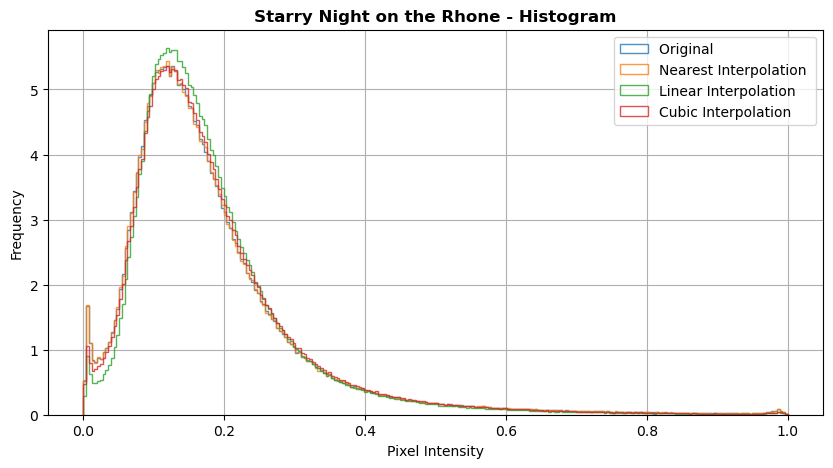

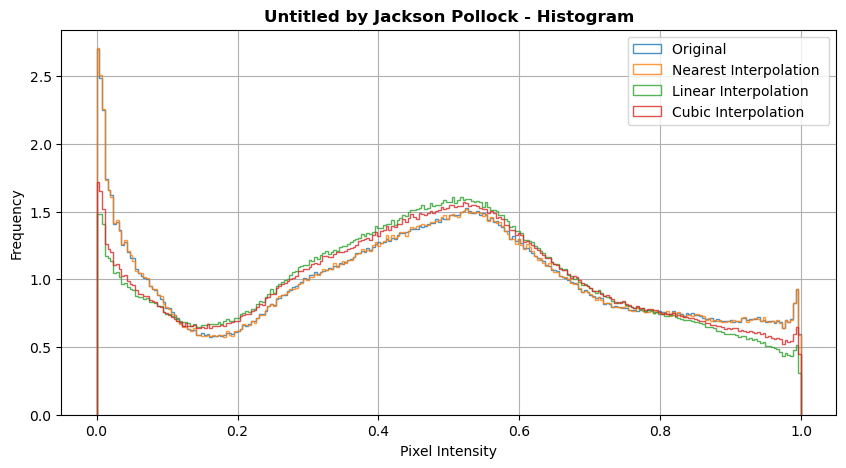

In [11]:
# Function to plot histograms
def plot_histograms(images, title):
    plt.figure(figsize=(10, 5))
    for i in range(4):
        plt.title(f'{title} - Histogram', fontweight='bold')
        plt.hist(images[i].ravel(), bins=256, range=[0, 1], alpha=0.8, density=True, histtype='step', 
                 label=f'{["Original", "Nearest", "Linear", "Cubic"][i]} {'Interpolation ' if i > 0 else ''}')
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')
        plt.legend()
    plt.grid(True)
    plt.show()
    
# Plot histograms for the original and interpolated images
plot_histograms([gray_starry] + interpolated_starrys, "Starry Night on the Rhone")
plot_histograms([gray_pollock] + interpolated_pollocks, "Untitled by Jackson Pollock")

<br><p><h4> <b>Pointwise Errors</b> </h4></p>

Calculate the Frobenius norm for the 3 filling and 3 interpolation methods.

In [8]:
# Define the filled images and labels
filled_starrys = [corrupted_starry_zero_filled, corrupted_images_mean_filled[0], corrupted_images_median_filled[0]]
filled_pollocks = [corrupted_pollock_zero_filled, corrupted_images_mean_filled[1], corrupted_images_median_filled[1]]
filled_methods = ['Zero', 'Mean', 'Median']

# Function to calculate Frobenius norm ignoring NaNs
def frobenius_norm(original, processed):
    error = original - processed
    return np.sqrt(np.nansum(error**2))

# Calculate Frobenius norms for filled images
frobenius_filled_starrys = [frobenius_norm(gray_starry, filled_image) for filled_image in filled_starrys]
frobenius_filled_pollocks = [frobenius_norm(gray_pollock, filled_image) for filled_image in filled_pollocks]

# Calculate Frobenius norms for interpolated images
frobenius_interpolated_starrys = [frobenius_norm(gray_starry, interpolated_image) for interpolated_image in interpolated_starrys]
frobenius_interpolated_pollocks = [frobenius_norm(gray_pollock, interpolated_image) for interpolated_image in interpolated_pollocks]

# Function to print Frobenius norms in both images
def print_frobenius_norms(frobenius_filled, frobenius_interpolated):
    print("\tFrobenius Norms for Filled Starry Night Images:")
    for method, norm in zip(filled_methods, frobenius_filled[0]):
        print(f"{method} Filled: \t{round(norm,3)}")

    print("\n\tFrobenius Norms for Filled Pollock Images:")
    for method, norm in zip(filled_methods, frobenius_filled[1]):
        print(f"{method} Filled: \t{round(norm,3)}")

    print("\n\tFrobenius Norms for Interpolated Starry Night Images:")
    for method, norm in zip(interpolation_methods, frobenius_interpolated[0]):
        print(f"{method.capitalize()} Interpolated: \t{round(norm,3)}")

    print("\n\tFrobenius Norms for Interpolated Pollock Images:")
    for method, norm in zip(interpolation_methods, frobenius_interpolated[1]):
        print(f"{method.capitalize()} Interpolated: \t{round(norm,3)}")
        
# Print results
print_frobenius_norms((frobenius_filled_starrys, frobenius_filled_pollocks), (frobenius_interpolated_starrys, frobenius_interpolated_pollocks))

	Frobenius Norms for Filled Starry Night Images:
Zero Filled: 	193.458
Mean Filled: 	111.568
Median Filled: 	114.499

	Frobenius Norms for Filled Pollock Images:
Zero Filled: 	656.023
Mean Filled: 	326.94
Median Filled: 	327.064

	Frobenius Norms for Interpolated Starry Night Images:
Nearest Interpolated: 	110.46
Linear Interpolated: 	93.039
Cubic Interpolated: 	99.173

	Frobenius Norms for Interpolated Pollock Images:
Nearest Interpolated: 	196.895
Linear Interpolated: 	135.394
Cubic Interpolated: 	112.675


<br><p><h4> <b>Varying Missing Data Proportions  </b> </h4></p>

Repeat the procedure losing 25% and 75%.

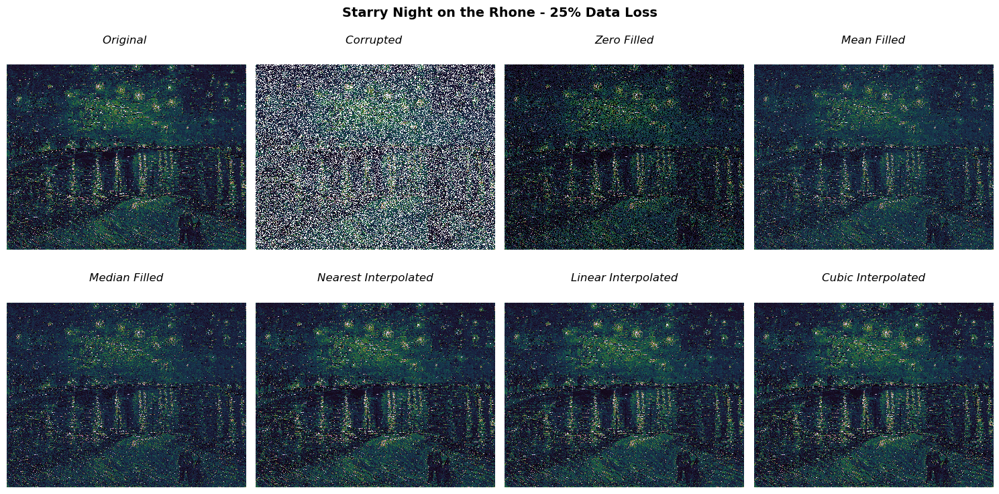

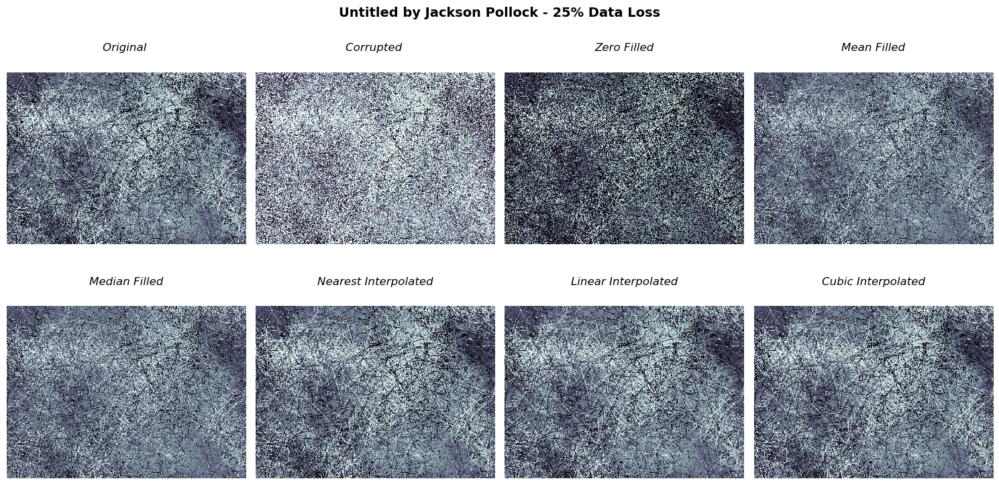

	Frobenius Norms for Filled Starry Night Images:
Zero Filled: 	136.048
Mean Filled: 	78.425
Median Filled: 	80.393

	Frobenius Norms for Filled Pollock Images:
Zero Filled: 	464.555
Mean Filled: 	231.433
Median Filled: 	231.51

	Frobenius Norms for Interpolated Starry Night Images:
Nearest Interpolated: 	76.786
Linear Interpolated: 	61.936
Cubic Interpolated: 	61.543

	Frobenius Norms for Interpolated Pollock Images:
Nearest Interpolated: 	136.164
Linear Interpolated: 	83.369
Cubic Interpolated: 	64.587


In [9]:
# Function to plot the 8 images
def plot_images(images, titles, suptitle):
    plt.figure(figsize=(15, 8))
    for i in range(8):
        plt.subplot(2, 4, i+1)
        plt.title(f"{titles[i].capitalize()} {"" if i < 2 else "Filled" if i < 5 else "Interpolated"}", fontstyle='italic')
        plt.matshow(images[i], fignum=0, cmap='cubehelix' if 'Starry' in suptitle else 'bone', vmin=0, vmax=1)
        plt.axis('off')
    plt.suptitle(suptitle, fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

# For 25% data loss
corrupted_starry_25 = lose_data(gray_starry, 0.25)
corrupted_pollock_25 = lose_data(gray_pollock, 0.25)

# Replaced NaNs with zeros, mean, and median
filled_starrys_25 = [np.nan_to_num(corrupted_starry_25, nan=0.0), replace_nan_with_mean(corrupted_starry_25), 
                     replace_nan_with_median(corrupted_starry_25)]
filled_pollocks_25 = [np.nan_to_num(corrupted_pollock_25, nan=0.0), replace_nan_with_mean(corrupted_pollock_25), 
                       replace_nan_with_median(corrupted_pollock_25)]

# Interpolate the images with 25% data loss
interpolated_starrys_25 = [interpolate_image(corrupted_starry_25, method) for method in interpolation_methods]
interpolated_pollocks_25 = [interpolate_image(corrupted_pollock_25, method) for method in interpolation_methods]

# Plot the images with 25% data loss
plot_images([gray_starry, corrupted_starry_25] + filled_starrys_25 + interpolated_starrys_25, 
            ["Original", 'Corrupted'] + filled_methods + interpolation_methods, 
            "Starry Night on the Rhone - 25% Data Loss")
plot_images([gray_pollock, corrupted_pollock_25] + filled_pollocks_25 + interpolated_pollocks_25, 
            ["Original", 'Corrupted'] + filled_methods + interpolation_methods, 
            "Untitled by Jackson Pollock - 25% Data Loss")

# Calculate Frobenius norms for filled images with 25% data loss
frobenius_filled_starrys_25 = [frobenius_norm(gray_starry, filled_image) for filled_image in filled_starrys_25]
frobenius_filled_pollocks_25 = [frobenius_norm(gray_pollock, filled_image) for filled_image in filled_pollocks_25]

# Calculate Frobenius norms for interpolated images with 25% data loss
frobenius_interpolated_starrys_25 = [frobenius_norm(gray_starry, interpolated_image) for interpolated_image in interpolated_starrys_25]
frobenius_interpolated_pollocks_25 = [frobenius_norm(gray_pollock, interpolated_image) for interpolated_image in interpolated_pollocks_25]

# Print results
print_frobenius_norms((frobenius_filled_starrys_25, frobenius_filled_pollocks_25), 
                      (frobenius_interpolated_starrys_25, frobenius_interpolated_pollocks_25))

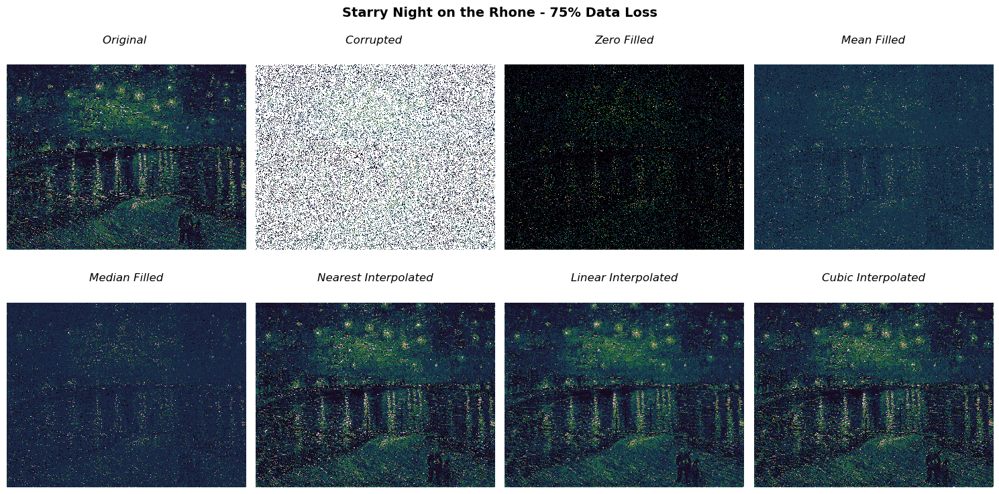

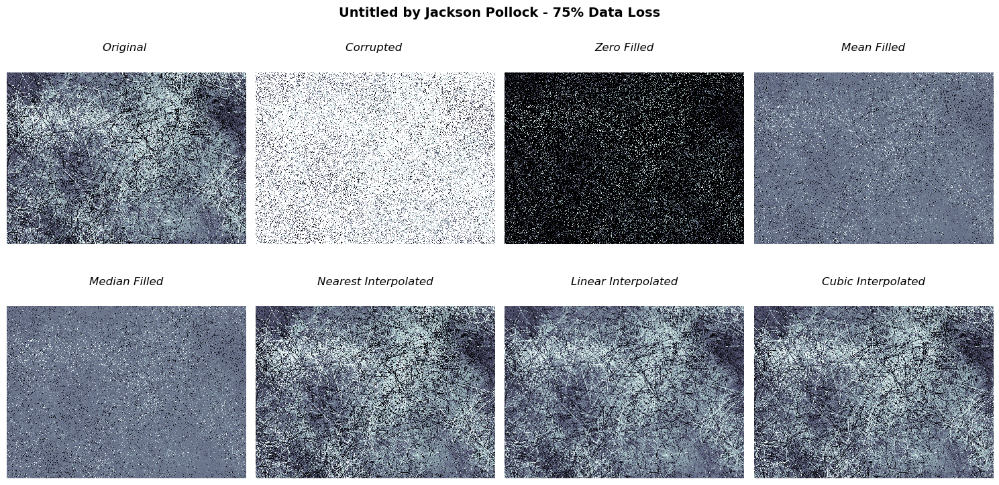

	Frobenius Norms for Filled Starry Night Images:
Zero Filled: 	236.752
Mean Filled: 	136.576
Median Filled: 	140.143

	Frobenius Norms for Filled Pollock Images:
Zero Filled: 	803.439
Mean Filled: 	400.435
Median Filled: 	400.587

	Frobenius Norms for Interpolated Starry Night Images:
Nearest Interpolated: 	143.628
Linear Interpolated: 	124.185
Cubic Interpolated: 	142.432

	Frobenius Norms for Interpolated Pollock Images:
Nearest Interpolated: 	269.854
Linear Interpolated: 	214.864
Cubic Interpolated: 	202.095


In [10]:
# For 75% data loss
corrupted_starry_75 = lose_data(gray_starry, 0.75)
corrupted_pollock_75 = lose_data(gray_pollock, 0.75)

# Replaced NaNs with zeros, mean, and median
filled_starrys_75 = [np.nan_to_num(corrupted_starry_75, nan=0.0), replace_nan_with_mean(corrupted_starry_75), 
                     replace_nan_with_median(corrupted_starry_75)]
filled_pollocks_75 = [np.nan_to_num(corrupted_pollock_75, nan=0.0), replace_nan_with_mean(corrupted_pollock_75), 
                       replace_nan_with_median(corrupted_pollock_75)]

# Interpolate the images with 75% data loss
interpolated_starrys_75 = [interpolate_image(corrupted_starry_75, method) for method in interpolation_methods]
interpolated_pollocks_75 = [interpolate_image(corrupted_pollock_75, method) for method in interpolation_methods]

# Plot the images with 75% data loss
plot_images([gray_starry, corrupted_starry_75] + filled_starrys_75 + interpolated_starrys_75, 
            ["Original", 'Corrupted'] + filled_methods + interpolation_methods, 
            "Starry Night on the Rhone - 75% Data Loss")
plot_images([gray_pollock, corrupted_pollock_75] + filled_pollocks_75 + interpolated_pollocks_75, 
            ["Original", 'Corrupted'] + filled_methods + interpolation_methods,
            "Untitled by Jackson Pollock - 75% Data Loss")

# Calculate Frobenius norms for filled images with 75% data loss
frobenius_filled_starrys_75 = [frobenius_norm(gray_starry, filled_image) for filled_image in filled_starrys_75]
frobenius_filled_pollocks_75 = [frobenius_norm(gray_pollock, filled_image) for filled_image in filled_pollocks_75]

# Calculate Frobenius norms for interpolated images with 75% data loss
frobenius_interpolated_starrys_75 = [frobenius_norm(gray_starry, interpolated_image) for interpolated_image in interpolated_starrys_75]
frobenius_interpolated_pollocks_75 = [frobenius_norm(gray_pollock, interpolated_image) for interpolated_image in interpolated_pollocks_75]

# Print results
print_frobenius_norms((frobenius_filled_starrys_75, frobenius_filled_pollocks_75), 
                      (frobenius_interpolated_starrys_75, frobenius_interpolated_pollocks_75))

<br>

**Starry Night Images**

For the "Starry Night on the Rhone" image, the Frobenius norms indicate that zero filling introduces the most error, with a norm of 236.752. Mean and median filling methods significantly reduce the error, with norms of 136.576 and 140.143, respectively, demonstrating their effectiveness in approximating the original image. Among the interpolation methods, linear interpolation performs best with the lowest norm of 124.185, suggesting it provides the most accurate restoration. Nearest neighbor and cubic interpolations also improve accuracy compared to zero filling, with norms of 143.628 and 142.432, respectively; but are less accurate than mean and medain methods.

**Pollock Images**

For the abstract Pollock image, zero filling results in a very high Frobenius norm of 803.439, indicating substantial deviation from the original image. Mean and median filling methods offer significant improvements, with norms around 400. Both methods perform similarly, reflecting their utility in handling complex, abstract patterns. Among the interpolation techniques, cubic interpolation yields the best results with a norm of 202.095, followed by linear interpolation at 214.864 and nearest neighbor interpolation at 269.854. These results highlight that more advanced interpolation methods are particularly beneficial for restoring abstract images.